In [1]:
#pip install --upgrade ipykernel

## Project Client: Bank GoodCredit | Category: Banking - Risk

**Business Case:**
 
Bank GoodCredit wants to predict cred score for current credit card customers. The cred score will denote a customer’s credit worthiness and help the bank in reducing credit default risk. 

Target variable → Bad_label

0 – Customer has Good credit history

1 – Customer has Bad credit history (falls into 30 DPD + bucket)

Our benchmark model has gini as 37.9. 

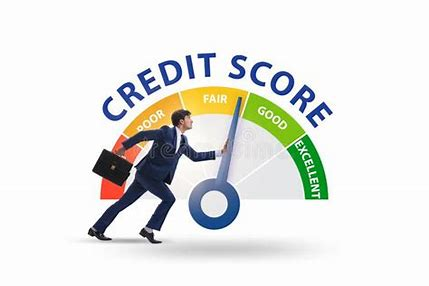

## PROJECT GOAL: 

Build a model with the data provided.
1. Data exploration insights – what did you find and what decision did you take?
2. Feature matrix - List of features selected with gain
3. Model evaluation - Gini and rank ordering

## Domain Analysis:

dt_opened_x: The date when the account was opened (x could indicate a specific account if there are multiple).

customer_no: A unique identifier for the customer.

upload_dt: The date when the data was uploaded.

acct_type: The type of account (e.g., savings, checking, loan).

owner_indic: Indicator of account ownership (e.g., individual, joint).

opened_dt: The date when the account was opened.

last_paymt_dt: The date of the last payment.

closed_dt: The date when the account was closed.

reporting_dt: The date when the account information was reported.

high_credit_amt: The highest amount of credit extended.

cur_balance_amt: The current balance amount.

amt_past_due: The amount past due.

paymenthistory1 and paymenthistory2: Payment history records.

paymt_str_dt and paymt_end_dt: Start and end dates of payment records.

creditlimit: The credit limit on the account.

cashlimit: The cash withdrawal limit.

rateofinterest: The interest rate applied to the account.

paymentfrequency: How often payments are made (e.g., monthly, quarterly).

actualpaymentamount: The actual amount paid.

**The features labeled as feature_1 to feature_79 could be specific attributes or engineered features relevant to the dataset’s domain and it’s challenging to provide exact definitions for these features.**

### Essential Libraries

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

**Connecting host server**

For fetching data in python ecosystem I am connecting to host's server. Said data is in hosts server's Mysql database so connecting ultimately to it using mysql connector.

In [3]:
# connecting database
import mysql.connector
connection= mysql.connector.connect(host = "18.136.157.135",
             port = 3306,
             user = "dm_team1",
             password = "DM!$Team&279@20!",
             database = "project_banking")

In [4]:
my_databases = connection.cursor() #  creating a cursor object named my_databases to interact with a database 
my_databases.execute('show databases')
results = my_databases.fetchall()
for i in results:
    print(i)

('information_schema',)
('project_banking',)


In [5]:
# getting all tables of bank goodcredit
my_tables=pd.read_sql_query('show tables',connection)
print(my_tables)

  Tables_in_project_banking
0              Cust_Account
1         Cust_Demographics
2              Cust_Enquiry


In [6]:
# put Cust_Account tables in variable
Cust_Account = pd.read_sql_query("Select * from Cust_Account",connection)

In [7]:
# put Cust_Demographics tables in variable
Cust_Demographics = pd.read_sql_query("Select * from Cust_Demographics",connection)

In [8]:
Cust_Enquiry = pd.read_sql_query("Select * from Cust_Enquiry",connection)

In [9]:
Cust_Account

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,...,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900,...,,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",,01-Sep-15,01-Jul-14,,,,,
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,,03-Oct-15,16201,...,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000,1400,,3,5603
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,,30-Sep-15,41028,...,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,,,,,
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,,26-Jul-07,31-Jan-09,93473,...,,"""""""1200900600600600300000000000000000000000000...",,01-Jul-07,01-Feb-06,,,,,
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,,31-May-15,20250,...,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186324,11-Jun-15,1611,25-May-15,10,1,02-May-07,21-Apr-15,,30-Apr-15,24228,...,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Apr-15,01-May-12,,,,,
186325,11-Jun-15,1611,25-May-15,10,1,11-Apr-07,22-Jun-09,02-Apr-10,30-Apr-15,19584,...,,"""""""000179146119089058029000XXX""""""",,01-Apr-10,01-Aug-09,,,,3,
186326,11-Jun-15,1611,25-May-15,10,1,20-Nov-06,,12-Apr-12,31-Dec-13,50844,...,,"""""""000XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",,01-Apr-12,01-Dec-10,,,,3,
186327,11-Jun-15,1611,25-May-15,10,1,17-Oct-06,,07-Mar-12,15-Apr-15,35587,...,,"""""""000010000000000000000000000000000XXXXXXXXXX...","""""""XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",01-Mar-12,01-Apr-09,15000,6000,,3,


In [10]:
Cust_Demographics

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,...,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,...,21,R,,,0000-00-00,0,98332XXXXX,1,N,0
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,...,17,R,,,0000-00-00,0,99455XXXXX,1,N,0
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,...,17,R,,,0000-00-00,0,98456XXXXX,1,N,0
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,...,21,R,,,6/15/65,1,98220XXXXX,1,N,0
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,...,13,R,,,0000-00-00,0,98111XXXXX,1,N,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,31-Dec-15,23892,10-Dec-15,Platinum Deligh,10-Dec-15,704,1,Card Setup,14,119000,...,13,R,Y,,0000-00-00,0,XXXXX,1,N,0
23892,17-Dec-15,23893,16-Nov-15,Platinum Deligh,,,2,Card Setup,14,35000,...,10,O,Y,,0000-00-00,0,99101XXXXX,1,N,0
23893,04-Nov-15,23894,24-Sep-15,Platinum Maxima,24-Sep-15,748,3,Card Setup,14,68000,...,13,R,,,0000-00-00,0,99111XXXXX,1,N,0
23894,03-Nov-15,23895,30-Sep-15,Platinum Deligh,30-Sep-15,740,3,Card Setup,14,158000,...,10,R,,,0000-00-00,0,93100XXXXX,1,N,0


In [11]:
Cust_Enquiry

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,18-Apr-15,1,21-Apr-15,19-Dec-14,2,3500000
1,18-Apr-15,1,21-Apr-15,05-Mar-14,5,500000
2,18-Apr-15,1,21-Apr-15,05-Mar-14,0,50000
3,18-Apr-15,1,21-Apr-15,22-Feb-14,10,50000
4,18-Apr-15,1,21-Apr-15,11-Jun-13,10,1000
...,...,...,...,...,...,...
413183,04-Dec-15,23896,09-Nov-15,22-Oct-11,5,200000
413184,04-Dec-15,23896,09-Nov-15,06-Jan-11,10,50000
413185,04-Dec-15,23896,09-Nov-15,01-Apr-10,10,50000
413186,04-Dec-15,23896,09-Nov-15,21-Feb-10,1,330000


**Its imp to note that in generating credit score for a customer, bank never take into consideration his enquries. So this table 'Cust_Enquiry' here has no ignificance in this project.**

In [12]:
# merging tables 
# ('customer_no' as the common column to merge the 'Cust_Account' and 'Cust_Demographics' tables 
# is a good choice because it is a unique identifier for each customer. This will ensure that each row
# in the merged table corresponds to a single customer.)

data = pd.merge(Cust_Account,Cust_Demographics,on ="customer_no",how="inner")
pd.set_option('display.max_columns',None)
data

,dt_opened_x,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,dt_opened_y,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900,0,,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",,01-Sep-15,01-Jul-14,,,,,,10-Nov-15,15-Oct-15,Platinum Maxima,15-Oct-15,683,3,Card Setup,14,56000,,,,Y,PM1,,,SA05,MA01,,,1,ASWPKXXXXX,15-Jun-84,88009XXXXX,N,@GMAIL.COM,1,0,MBA/MMS,New Delhi,110059,2006,0,Paren,Y,1,35000,Private Ltd. Co.,Others,SR EXE,2009,1,4,0,Gurgaon,122001,,PAN Card,ASWPKXXXXX,,,N,,0,,17-Jun-16,1,10,,N,Y,N,,Y,2006-0,10,157,110059,0,1,35000,0-0,13,R,,,0000-00-00,0,88009XXXXX,1,N,1
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,,03-Oct-15,16201,10390,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000,1400,,3,5603,10-Nov-15,15-Oct-15,Platinum Maxima,15-Oct-15,683,3,Card Setup,14,56000,,,,Y,PM1,,,SA05,MA01,,,1,ASWPKXXXXX,15-Jun-84,88009XXXXX,N,@GMAIL.COM,1,0,MBA/MMS,New Delhi,110059,2006,0,Paren,Y,1,35000,Private Ltd. Co.,Others,SR EXE,2009,1,4,0,Gurgaon,122001,,PAN Card,ASWPKXXXXX,,,N,,0,,17-Jun-16,1,10,,N,Y,N,,Y,2006-0,10,157,110059,0,1,35000,0-0,13,R,,,0000-00-00,0,88009XXXXX,1,N,1
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,,30-Sep-15,41028,34420,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,,,,,,10-Nov-15,15-Oct-15,Platinum Maxima,15-Oct-15,683,3,Card Setup,14,56000,,,,Y,PM1,,,SA05,MA01,,,1,ASWPKXXXXX,15-Jun-84,88009XXXXX,N,@GMAIL.COM,1,0,MBA/MMS,New Delhi,110059,2006,0,Paren,Y,1,35000,Private Ltd. Co.,Others,SR EXE,2009,1,4,0,Gurgaon,122001,,PAN Card,ASWPKXXXXX,,,N,,0,,17-Jun-16,1,10,,N,Y,N,,Y,2006-0,10,157,110059,0,1,35000,0-0,13,R,,,0000-00-00,0,88009XXXXX,1,N,1
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,,26-Jul-07,31-Jan-09,93473,0,,"""""""1200900600600600300000000000000000000000000...",,01-Jul-07,01-Feb-06,,,,,,20-Jul-15,06-Jul-15,Platinum Deligh,06-Jul-15,687,3,Card Setup,14,125000,,,,Y,PD1,PD3,12,SA35,S001,,,1,AHRPMXXXXX,20-Jun-80,88009XXXXX,N,@YAHOO.COM,1,2,Post-Graduate,Faridabad,121003,2009,0,Self,Y,1,100000,Private Ltd. Co.,Banking/Financial Services,GENRAL MANAGER OPERATIONS,2013,1,2,0,Faridabad,121003,@SUPERFASHIONINDIA.COM,PAN Card,AHRPMXXXXX,Indian Bank,,N,,0,,17-Jun-16,1,13,,N,Y,N,,Y,2009-0,13,39,121003,0,1,100000,0-0,13,R,,,0000-00-00,0,XXXXX,1,N,1
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,,31-May-15,20250,13500,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,,20-Jul-15,06-Jul-15,Platinum Deligh,06-Jul-15,687,3,Card Setup,14,125000,,,,Y,PD1,PD3,12,SA35,S001,,,1,AHRPMXXXXX,20-Jun-80,88009XXXXX,N,@YAHOO.COM,1,2,Post-Graduate,Faridabad,121003,2009,0,Self,Y,1,100000,Private Ltd. Co.,Banking/Financial Services,GENRAL MANAGER OPERATIONS,2013,1,2,0,Faridabad,121003,@SUPERFASHIONINDIA.COM,PAN Card,AHRPMXXXXX,Indi

In [13]:
data.describe()

,dt_opened_x,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,dt_opened_y,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
count,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329
unique,197,23896,75,31,4,6246,4511,4840,1877,67555,56425,630,18311,11912,234,235,1380,1456,1476,3,18300,197,297,8,282,263,4,2,2,485,20,20,8,3,17,15,3,365,523,303,13,3,10610,8463,3251,3,722,3,12,11,63,965,53,14,6,3,4,4334,10,12,5664,19,14,13,13,71,937,4473,6,11250,57,19,3,11,660,181,2,5,13,3,3,3,3,9,3,492,28,425,3013,3,4,4334,134,14,3,3,4,63,6,3124,4,3,2
top,16-Nov-15,8516,21-Apr-15,10,1,13-Apr-12,,,31-Jul-15,,0,,"""""""0000000000000000000000000000000000000000000...",,01-Jul-15,01-Jan-15,,,,,,16-Nov-15,23-Oct-15,Platinum Maxima,,,3,Card Setup,14,150000,,,,Y,PM1,,12,SA03,AS03,,,1,AAIPKXXXXX,01-Jan-86,98100XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110059,2010,0,Self,Y,1,1,Private Ltd. Co.,Banking/Financial Services,,0,0,0,0,New Delhi,201301,,PAN Card,XXXXX,,,Y,,0,,17-Jun-16,1,10,,N,Y,N,,Y,2010-0,10,157,110059,0,1,1,0-0,10,R,,,0000-00-00,0,XXXXX,1,N,0
freq,4643,120,5128,100239,177287,514,25487,109075,12654,8875,89872,185453,44979,107824,16747,5640,137477,151047,161496,122436,145276,4643,1478,76014,20401,20401,114716,186196,186196,5985,176212,176212,185958,177801,74160,108074,78255,68912,9382,176325,186121,178862,173,176,1672,164440,112409,156610,109617,110025,87577,7498,13905,167805,92451,160573,133980,61597,61860,97943,52349,52216,60444,53877,182249,70243,15257,103193,176024,940,140986,185406,103897,83203,85133,84043,186196,178905,87577,169092,182223,177801,183578,186217,186161,12813,75473,75473,6646,160573,133980,61597,134163,70243,130100,164759,186132,185399,185462,16349,179451,186166,179716


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 186329 entries, 0 to 186328
Columns: 103 entries, dt_opened_x to Bad_label
dtypes: object(103)
memory usage: 147.8+ MB


In [15]:
data.describe(include='O')

,dt_opened_x,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,dt_opened_y,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
count,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329,186329
unique,197,23896,75,31,4,6246,4511,4840,1877,67555,56425,630,18311,11912,234,235,1380,1456,1476,3,18300,197,297,8,282,263,4,2,2,485,20,20,8,3,17,15,3,365,523,303,13,3,10610,8463,3251,3,722,3,12,11,63,965,53,14,6,3,4,4334,10,12,5664,19,14,13,13,71,937,4473,6,11250,57,19,3,11,660,181,2,5,13,3,3,3,3,9,3,492,28,425,3013,3,4,4334,134,14,3,3,4,63,6,3124,4,3,2
top,16-Nov-15,8516,21-Apr-15,10,1,13-Apr-12,,,31-Jul-15,,0,,"""""""0000000000000000000000000000000000000000000...",,01-Jul-15,01-Jan-15,,,,,,16-Nov-15,23-Oct-15,Platinum Maxima,,,3,Card Setup,14,150000,,,,Y,PM1,,12,SA03,AS03,,,1,AAIPKXXXXX,01-Jan-86,98100XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110059,2010,0,Self,Y,1,1,Private Ltd. Co.,Banking/Financial Services,,0,0,0,0,New Delhi,201301,,PAN Card,XXXXX,,,Y,,0,,17-Jun-16,1,10,,N,Y,N,,Y,2010-0,10,157,110059,0,1,1,0-0,10,R,,,0000-00-00,0,XXXXX,1,N,0
freq,4643,120,5128,100239,177287,514,25487,109075,12654,8875,89872,185453,44979,107824,16747,5640,137477,151047,161496,122436,145276,4643,1478,76014,20401,20401,114716,186196,186196,5985,176212,176212,185958,177801,74160,108074,78255,68912,9382,176325,186121,178862,173,176,1672,164440,112409,156610,109617,110025,87577,7498,13905,167805,92451,160573,133980,61597,61860,97943,52349,52216,60444,53877,182249,70243,15257,103193,176024,940,140986,185406,103897,83203,85133,84043,186196,178905,87577,169092,182223,177801,183578,186217,186161,12813,75473,75473,6646,160573,133980,61597,134163,70243,130100,164759,186132,185399,185462,16349,179451,186166,179716


## Data Preprocessing

In [16]:
data.isnull().sum()

dt_opened_x    0
customer_no    0
upload_dt      0
acct_type      0
owner_indic    0
              ..
feature_76     0
feature_77     0
feature_78     0
feature_79     0
Bad_label      0
Length: 103, dtype: int64

In [17]:
columns_with_null = data.columns[data.isna().any()].tolist()
print(columns_with_null)

[]


In [18]:
data.duplicated().sum()

2401

In [19]:
duplicate_rows = data.duplicated()
# filter only duplicate rows
duplicate_data = data.loc[duplicate_rows]
duplicate_data

,dt_opened_x,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,dt_opened_y,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
80,27-Aug-15,17744,10-Aug-15,10,1,22-Aug-14,25-Jun-15,,11-Jul-15,15702,15183,,"""""""000000000000000000000000000000000""""""",,01-Jul-15,01-Sep-14,116000,34800,,3,810,27-Aug-15,06-Aug-15,Platinum Deligh,06-Aug-15,740,3,Card Setup,14,151000,,,,Y,PD1,PD3,12,SA03,AS06,,,1,AQTPRXXXXX,22-Aug-80,99100XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110067,1980,0,Rente,N,1,1,Proprietorship,Banking/Financial Services,ADMINISTRATOR,2005,1,10,1,Noida,201301,,PAN Card,AQTPRXXXXX,,,Y,State Bank of India,116000,01-Aug-14,17-Jun-16,1,10,,N,Y,N,,Y,1980-0,10,157,110096,1,1,1,0-0,33,O,,,0000-00-00,0,99100XXXXX,1,N,0
81,27-Aug-15,17744,10-Aug-15,5,1,05-May-14,05-May-15,,31-May-15,100000,72570,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,,27-Aug-15,06-Aug-15,Platinum Deligh,06-Aug-15,740,3,Card Setup,14,151000,,,,Y,PD1,PD3,12,SA03,AS06,,,1,AQTPRXXXXX,22-Aug-80,99100XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110067,1980,0,Rente,N,1,1,Proprietorship,Banking/Financial Services,ADMINISTRATOR,2005,1,10,1,Noida,201301,,PAN Card,AQTPRXXXXX,,,Y,State Bank of India,116000,01-Aug-14,17-Jun-16,1,10,,N,Y,N,,Y,1980-0,10,157,110096,1,1,1,0-0,33,O,,,0000-00-00,0,99100XXXXX,1,N,0
82,27-Aug-15,17744,10-Aug-15,10,1,08-May-13,10-Jun-15,,30-Jun-15,28261,-6327,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000""""""",01-Jun-15,01-May-13,,,,,,27-Aug-15,06-Aug-15,Platinum Deligh,06-Aug-15,740,3,Card Setup,14,151000,,,,Y,PD1,PD3,12,SA03,AS06,,,1,AQTPRXXXXX,22-Aug-80,99100XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110067,1980,0,Rente,N,1,1,Proprietorship,Banking/Financial Services,ADMINISTRATOR,2005,1,10,1,Noida,201301,,PAN Card,AQTPRXXXXX,,,Y,State Bank of India,116000,01-Aug-14,17-Jun-16,1,10,,N,Y,N,,Y,1980-0,10,157,110096,1,1,1,0-0,33,O,,,0000-00-00,0,99100XXXXX,1,N,0
83,27-Aug-15,17744,10-Aug-15,10,1,19-Mar-12,29-Jun-15,,30-Jun-15,25523,7688,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Jun-15,01-Jul-12,73000,,39,,1000,27-Aug-15,06-Aug-15,Platinum Deligh,06-Aug-15,740,3,Card Setup,14,151000,,,,Y,PD1,PD3,12,SA03,AS06,,,1,AQTPRXXXXX,22-Aug-80,99100XXXXX,N,@GMAIL.COM,1,0,Graduate,New Delhi,110067,1980,0,Rente,N,1,1,Proprietorship,Banking/Financial Services,ADMINISTRATOR,2005,1,10,1,Noida,201301,,PAN Card,AQTPRXXXXX,,,Y,State Bank of India,116000,01-Aug-14,17-Jun-16,1,10,,N,Y,N,,Y,1980-0,10,157,110096,1,1,1,0-0,33,O,,,0000-00-00,0,99100XXXXX,1,N,0
378,06-Nov-15,4920,29-Oct-15,10,1,04-May-06,,04-May-06,30-Sep-06,,0,,"""""""000""""""",,01-May-06,01-May-06,,,,,,06-Nov-15,27-Oct-15,Titanium Deligh,27-Oct-15,701,3,Card Setup,14,100000,,,,Y,TD1,,0,DD01,D074,,,1,AAIPKXXXXX,09-Jul-75,98110XXXXX,N,,1,0,,New Delhi,110009,1975,0,Self,Y,2,1,,,,0,0,0,0,New Delhi,110006,,PAN Card,AAIPKXXXXX,,,N,,0,,17-Jun-16,1,10,,N,Y,N,,Y,1975

**Actually there are no duplicates (found out upon observation)**

**Dropping few columns which were irrelevant to the project:**

In [20]:
drop_columns = ['customer_no','dt_opened_x','upload_dt', 'opened_dt', 'last_paymt_dt', 'closed_dt', 'reporting_dt', 'acct_type', 'owner_indic',
                'paymt_str_dt', 'paymt_end_dt', 'paymenthistory1','rateofinterest', 'paymentfrequency', 'dt_opened_y', 'entry_time',
                 'feature_2', 'feature_5','feature_20', 'feature_21', 'feature_22', 'feature_24', 'feature_29', 'feature_30', 
                'feature_32', 'feature_38','feature_39','feature_43', 'feature_44', 'feature_45', 'feature_46', 'feature_47', 'feature_52',
                'feature_53', 'feature_54', 'feature_63', 'feature_66', 'feature_70', 'feature_75', 'feature_77']

data = data.drop(columns=drop_columns)

In [21]:
data 

,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory2,creditlimit,cashlimit,actualpaymentamount,feature_1,feature_3,feature_4,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_23,feature_25,feature_26,feature_27,feature_28,feature_31,feature_33,feature_34,feature_35,feature_36,feature_37,feature_40,feature_41,feature_42,feature_48,feature_49,feature_50,feature_51,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_64,feature_65,feature_67,feature_68,feature_69,feature_71,feature_72,feature_73,feature_74,feature_76,feature_78,feature_79,Bad_label
0,20900,0,,,,,,Platinum Maxima,683,3,14,56000,,,,Y,PM1,,,SA05,MA01,,,1,N,1,0,MBA/MMS,New Delhi,0,Y,1,35000,Private Ltd. Co.,Others,1,4,0,,,N,,1,10,,N,Y,N,,Y,10,157,0,1,35000,13,R,,,0,1,N,1
1,16201,10390,,"""""""000000000000000000000000000XXX0000000000000...",14000,1400,5603,Platinum Maxima,683,3,14,56000,,,,Y,PM1,,,SA05,MA01,,,1,N,1,0,MBA/MMS,New Delhi,0,Y,1,35000,Private Ltd. Co.,Others,1,4,0,,,N,,1,10,,N,Y,N,,Y,10,157,0,1,35000,13,R,,,0,1,N,1
2,41028,34420,,"""""""0000000000000000000000000000000000000000000...",,,,Platinum Maxima,683,3,14,56000,,,,Y,PM1,,,SA05,MA01,,,1,N,1,0,MBA/MMS,New Delhi,0,Y,1,35000,Private Ltd. Co.,Others,1,4,0,,,N,,1,10,,N,Y,N,,Y,10,157,0,1,35000,13,R,,,0,1,N,1
3,93473,0,,,,,,Platinum Deligh,687,3,14,125000,,,,Y,PD1,PD3,12,SA35,S001,,,1,N,1,2,Post-Graduate,Faridabad,0,Y,1,100000,Private Ltd. Co.,Banking/Financial Services,1,2,0,Indian Bank,,N,,1,13,,N,Y,N,,Y,13,39,0,1,100000,13,R,,,0,1,N,1
4,20250,13500,,,,,,Platinum Deligh,687,3,14,125000,,,,Y,PD1,PD3,12,SA35,S001,,,1,N,1,2,Post-Graduate,Faridabad,0,Y,1,100000,Private Ltd. Co.,Banking/Financial Services,1,2,0,Indian Bank,,N,,1,13,,N,Y,N,,Y,13,39,0,1,100000,13,R,,,0,1,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186324,24228,24228,,"""""""0000000000000000000000000000000000000000000...",,,,Titanium Deligh,746,3,14,138000,,,,Y,TD1,,0,BBOL,H004,,,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,,N,,1,2,,N,Y,N,,Y,2,14,0,1,45800,2,R,,,0,1,N,0
186325,19584,0,,,,,,Titanium Deligh,746,3,14,138000,,,,Y,TD1,,0,BBOL,H004,,,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,,N,,1,2,,N,Y,N,,Y,2,14,0,1,45800,2,R,,,0,1,N,0
186326,50844,0,,,,,,Titanium Deligh,746,3,14,138000,,,,Y,TD1,,0,BBOL,H004,,,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,,N,,1,2,,N,Y,N,,Y,2,14,0,1,45800,2,R,,,0,1,N,0
186327,35587,0,,"""""""XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",15000,6000,,Titanium Deligh,746,3,14,138000,,,,Y,TD1,,0,BBOL,H004,,,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,,N,,1,2,,N,Y,N,,Y,2,14,0,1,45800,2,R,,,0,1,N,0


## dropping those features which has >35% null values

In [22]:
# Replace empty strings with NaN
data.replace('', np.nan, inplace=True)

# Identify columns with blank or empty values
columns_with_blank_values = data.columns[data.isna().any()].tolist()

# Display the columns with blank or empty values
print(f"Columns with blank or empty values: {columns_with_blank_values}")

# Set the threshold for null values (35% in this case)
threshold_percentage = 35

# Calculate the percentage of null values (including empty strings) in each column
null_percentage_per_column = (data.isnull().sum() / len(data)) * 100

# Identify columns where the null percentage exceeds the threshold
columns_to_drop = null_percentage_per_column[null_percentage_per_column > threshold_percentage].index.tolist()
columns_to_drop

Columns with blank or empty values: ['high_credit_amt', 'amt_past_due', 'paymenthistory2', 'creditlimit', 'cashlimit', 'actualpaymentamount', 'feature_1', 'feature_3', 'feature_4', 'feature_6', 'feature_7', 'feature_8', 'feature_9', 'feature_10', 'feature_11', 'feature_12', 'feature_13', 'feature_14', 'feature_15', 'feature_16', 'feature_17', 'feature_18', 'feature_19', 'feature_23', 'feature_25', 'feature_26', 'feature_27', 'feature_28', 'feature_31', 'feature_33', 'feature_34', 'feature_35', 'feature_36', 'feature_37', 'feature_40', 'feature_41', 'feature_42', 'feature_48', 'feature_49', 'feature_50', 'feature_51', 'feature_55', 'feature_56', 'feature_57', 'feature_58', 'feature_59', 'feature_60', 'feature_61', 'feature_62', 'feature_64', 'feature_65', 'feature_67', 'feature_68', 'feature_69', 'feature_71', 'feature_72', 'feature_73', 'feature_74', 'feature_76', 'feature_78', 'feature_79']


['amt_past_due',
 'paymenthistory2',
 'creditlimit',
 'cashlimit',
 'actualpaymentamount',
 'feature_8',
 'feature_9',
 'feature_10',
 'feature_13',
 'feature_17',
 'feature_18',
 'feature_48',
 'feature_49',
 'feature_51',
 'feature_57',
 'feature_61',
 'feature_73',
 'feature_74']

### Further dropping few features: 

In [23]:
drop_columns_2=['amt_past_due', 'paymenthistory2', 'creditlimit', 'cashlimit', 'actualpaymentamount', 'feature_8',
 'feature_9', 'feature_10', 'feature_13', 'feature_17', 'feature_18', 'feature_49','feature_51', 'feature_57',
 'feature_61', 'feature_73', 'feature_74']
data= data.drop(columns=drop_columns_2)
data

,high_credit_amt,cur_balance_amt,feature_1,feature_3,feature_4,feature_6,feature_7,feature_11,feature_12,feature_14,feature_15,feature_16,feature_19,feature_23,feature_25,feature_26,feature_27,feature_28,feature_31,feature_33,feature_34,feature_35,feature_36,feature_37,feature_40,feature_41,feature_42,feature_48,feature_50,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_64,feature_65,feature_67,feature_68,feature_69,feature_71,feature_72,feature_76,feature_78,feature_79,Bad_label
0,20900,0,Platinum Maxima,683,3,14,56000,Y,PM1,NaN,SA05,MA01,1,N,1,0,MBA/MMS,New Delhi,0,Y,1,35000,Private Ltd. Co.,Others,1,4,0,NaN,N,1,10,N,Y,N,Y,10,157,0,1,35000,13,R,0,1,N,1
1,16201,10390,Platinum Maxima,683,3,14,56000,Y,PM1,NaN,SA05,MA01,1,N,1,0,MBA/MMS,New Delhi,0,Y,1,35000,Private Ltd. Co.,Others,1,4,0,NaN,N,1,10,N,Y,N,Y,10,157,0,1,35000,13,R,0,1,N,1
2,41028,34420,Platinum Maxima,683,3,14,56000,Y,PM1,NaN,SA05,MA01,1,N,1,0,MBA/MMS,New Delhi,0,Y,1,35000,Private Ltd. Co.,Others,1,4,0,NaN,N,1,10,N,Y,N,Y,10,157,0,1,35000,13,R,0,1,N,1
3,93473,0,Platinum Deligh,687,3,14,125000,Y,PD1,12,SA35,S001,1,N,1,2,Post-Graduate,Faridabad,0,Y,1,100000,Private Ltd. Co.,Banking/Financial Services,1,2,0,Indian Bank,N,1,13,N,Y,N,Y,13,39,0,1,100000,13,R,0,1,N,1
4,20250,13500,Platinum Deligh,687,3,14,125000,Y,PD1,12,SA35,S001,1,N,1,2,Post-Graduate,Faridabad,0,Y,1,100000,Private Ltd. Co.,Banking/Financial Services,1,2,0,Indian Bank,N,1,13,N,Y,N,Y,13,39,0,1,100000,13,R,0,1,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186324,24228,24228,Titanium Deligh,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0
186325,19584,0,Titanium Deligh,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0
186326,50844,0,Titanium Deligh,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0
186327,35587,0,Titanium Deligh,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,Post-Graduate,Hyderabad / Secunderabad,0,Y,1,45800,Private Ltd. Co.,Banking/Financial Services,0,11,0,HDFC Bank,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0


## EDA

**EDA is possible only on known features as company has duisguised some of features for security purpose.**

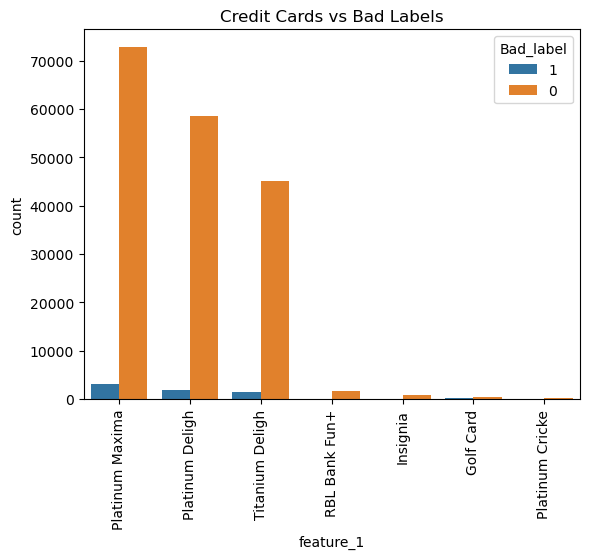

In [24]:
sns.countplot(x='feature_1', hue='Bad_label', data=data)
plt.title("Credit Cards vs Bad Labels")
plt.xticks(rotation=90)
plt.show()

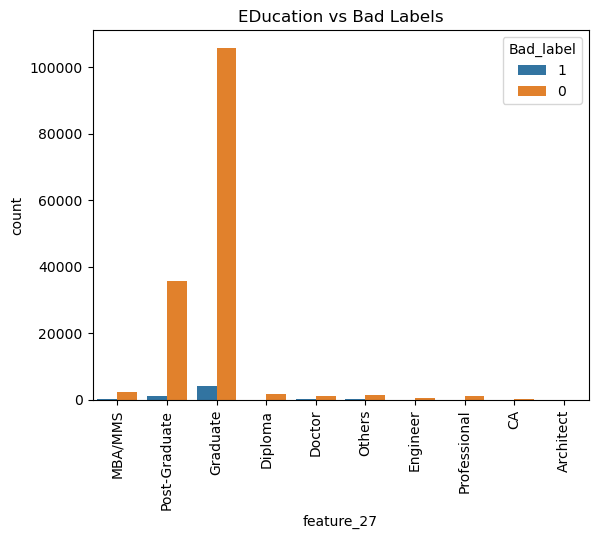

In [25]:
custom_colors = ['skyblue', 'aliceblue']
sns.countplot(x='feature_27', hue='Bad_label', data=data)
plt.title("EDucation vs Bad Labels")
plt.xticks(rotation=90)
plt.show()

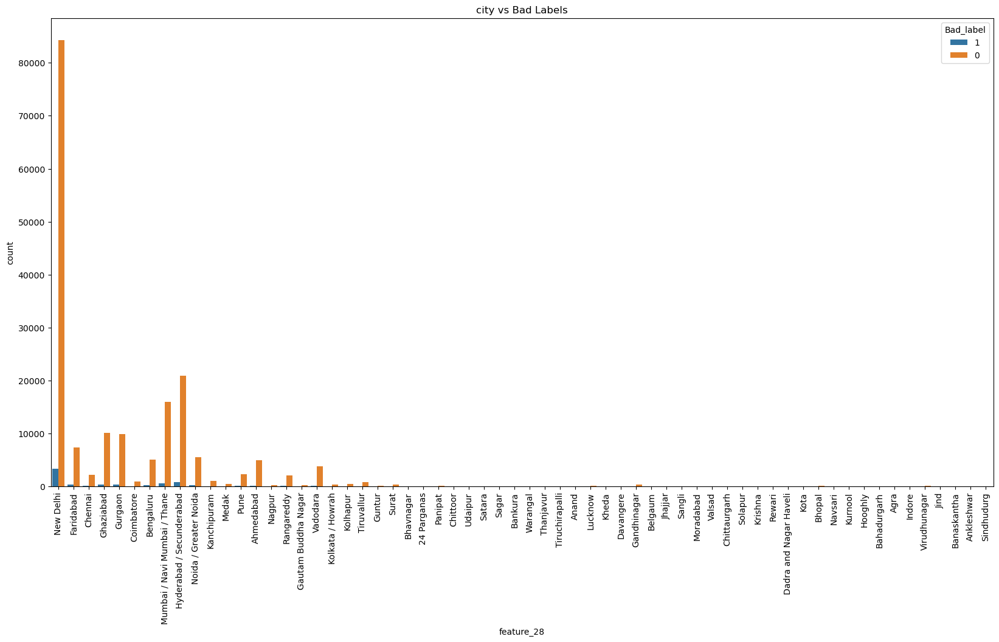

In [26]:
plt.figure(figsize=(20, 10))
sns.countplot(x='feature_28', hue='Bad_label', data=data)
plt.title("city vs Bad Labels")
plt.xticks(rotation=90)
plt.show()

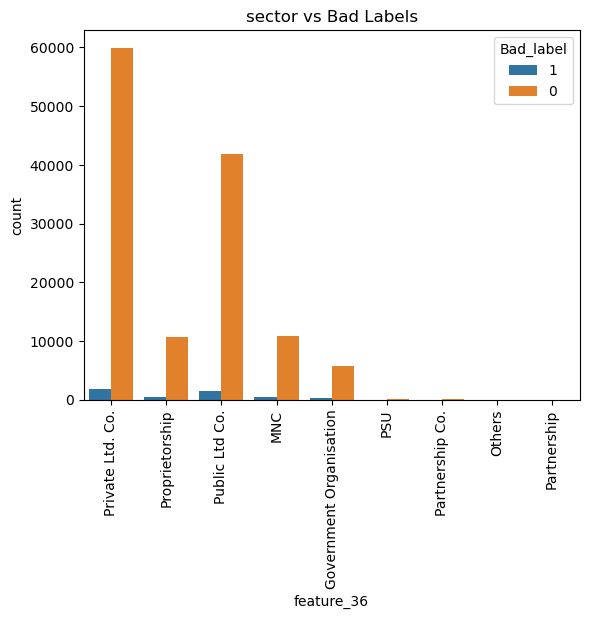

In [27]:
sns.countplot(x='feature_36', hue='Bad_label', data=data)
plt.title("sector vs Bad Labels")
plt.xticks(rotation=90)
plt.show()

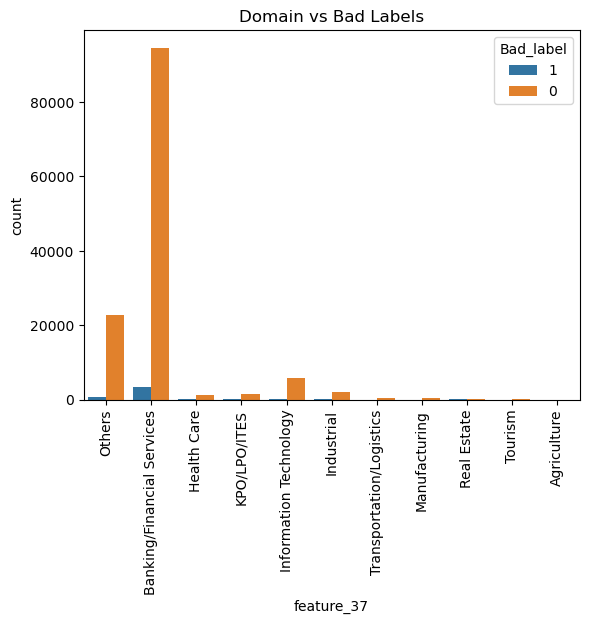

In [28]:
sns.countplot(x='feature_37', hue='Bad_label', data=data)
plt.title("Domain vs Bad Labels")
plt.xticks(rotation=90)
plt.show()

**Insights**

1.Most of the person having Platinum Maxima and Platinum Deligh and Titanium delight Cards has Good credit history.

2.>95% of the customers have good credit score.

3.Graduate peole are highest in number in gaining Credit score 

4.>95% of the Customers belong to New Delhi.

5.highest no. of the Customer having good Credit score belong to Private Ltd.Co and second highest are from Public ltd.co.

6.Banking/Financial services sector person are highest in count having good credit score.

In [29]:
drop_columns_3 = ['feature_1', 'feature_27', 'feature_28', 'feature_36', 'feature_37', 'feature_48']
data = data.drop(columns=drop_columns_3)

In [30]:
data 

,high_credit_amt,cur_balance_amt,feature_3,feature_4,feature_6,feature_7,feature_11,feature_12,feature_14,feature_15,feature_16,feature_19,feature_23,feature_25,feature_26,feature_31,feature_33,feature_34,feature_35,feature_40,feature_41,feature_42,feature_50,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_64,feature_65,feature_67,feature_68,feature_69,feature_71,feature_72,feature_76,feature_78,feature_79,Bad_label
0,20900,0,683,3,14,56000,Y,PM1,NaN,SA05,MA01,1,N,1,0,0,Y,1,35000,1,4,0,N,1,10,N,Y,N,Y,10,157,0,1,35000,13,R,0,1,N,1
1,16201,10390,683,3,14,56000,Y,PM1,NaN,SA05,MA01,1,N,1,0,0,Y,1,35000,1,4,0,N,1,10,N,Y,N,Y,10,157,0,1,35000,13,R,0,1,N,1
2,41028,34420,683,3,14,56000,Y,PM1,NaN,SA05,MA01,1,N,1,0,0,Y,1,35000,1,4,0,N,1,10,N,Y,N,Y,10,157,0,1,35000,13,R,0,1,N,1
3,93473,0,687,3,14,125000,Y,PD1,12,SA35,S001,1,N,1,2,0,Y,1,100000,1,2,0,N,1,13,N,Y,N,Y,13,39,0,1,100000,13,R,0,1,N,1
4,20250,13500,687,3,14,125000,Y,PD1,12,SA35,S001,1,N,1,2,0,Y,1,100000,1,2,0,N,1,13,N,Y,N,Y,13,39,0,1,100000,13,R,0,1,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186324,24228,24228,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,0,Y,1,45800,0,11,0,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0
186325,19584,0,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,0,Y,1,45800,0,11,0,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0
186326,50844,0,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,0,Y,1,45800,0,11,0,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0
186327,35587,0,746,3,14,138000,Y,TD1,0,BBOL,H004,1,N,1,3,0,Y,1,45800,0,11,0,N,1,2,N,Y,N,Y,2,14,0,1,45800,2,R,0,1,N,0


## Handelling Nan Values

In [31]:
data.isnull().sum()

high_credit_amt     8875
cur_balance_amt        0
feature_3          20401
feature_4            133
feature_6            133
feature_7            133
feature_11           133
feature_12           133
feature_14         61388
feature_15           212
feature_16           259
feature_19           133
feature_23           133
feature_25           133
feature_26           133
feature_31           133
feature_33           133
feature_34           133
feature_35           133
feature_40           133
feature_41           133
feature_42           133
feature_50           133
feature_55           133
feature_56           133
feature_58           133
feature_59           133
feature_60           133
feature_62           133
feature_64           133
feature_65           133
feature_67           133
feature_68           133
feature_69           133
feature_71           133
feature_72           133
feature_76           133
feature_78           133
feature_79           133
Bad_label              0


In [32]:
data.high_credit_amt.unique()

array(['20900', '16201', '41028', ..., '97741', '34001', '29516'],
      dtype=object)

In [33]:
data['high_credit_amt'] = pd.to_numeric(data['high_credit_amt'], errors='coerce')

# Now you can calculate the mean and fill NaN values
mean_high_credit_amt = np.mean(data['high_credit_amt'])
data['high_credit_amt'].fillna(mean_high_credit_amt, inplace=True)

In [34]:
pd.set_option('display.max_rows', None)   ## i will handel it at later stage
counts = data['feature_3'].value_counts(dropna=False)
print(counts)

NaN    20401
682     3132
694     2842
676     2575
708     2556
700     2425
728     2404
715     2286
736     2196
719     2137
725     2121
737     2101
716     2092
727     2063
747     2035
733     2011
718     2007
730     1960
690     1933
699     1918
705     1911
696     1905
724     1904
739     1877
731     1860
726     1849
721     1776
735     1774
709     1771
732     1747
687     1741
713     1719
707     1704
704     1691
729     1665
717     1632
697     1625
714     1595
701     1588
712     1580
752     1572
738     1535
743     1499
748     1484
759     1466
711     1460
723     1454
722     1453
693     1421
741     1412
689     1406
749     1395
734     1388
703     1387
706     1381
766     1375
740     1374
757     1323
744     1309
745     1302
753     1279
692     1273
685     1268
720     1242
758     1208
677     1200
710     1194
778     1169
695     1098
686     1088
746     1083
688     1082
751     1073
702     1071
742     1046
760     1043
691     1019

In [35]:
counts = data['feature_4'].value_counts(dropna=False)
print(counts)

3      114716
1       55591
2       15889
NaN       133
Name: feature_4, dtype: int64


In [36]:
data['feature_4'].fillna(3, inplace=True)

In [37]:
counts = data['feature_11'].value_counts(dropna=False)
print(counts)

Y      177801
N        8395
NaN       133
Name: feature_11, dtype: int64


In [38]:
mode_value = data['feature_11'].mode()[0]  
data['feature_11'] = data['feature_11'].fillna(mode_value)

In [39]:
counts = data['feature_12'].value_counts(dropna=False)
print(counts)

PM1    74160
PD1    60170
TD1    46212
PM2     1835
PB1     1587
IS1      750
GO1      465
TD2      346
DD1      297
PD2      150
NaN      133
IS2      124
PB2       57
DD2       24
PM3       16
PM4        2
PD3        1
Name: feature_12, dtype: int64


In [40]:
mode_value = data['feature_12'].mode()[0]  

data['feature_12'] = data['feature_12'].fillna(mode_value)

In [41]:
total_frequency = 78255 + 46686

proportion_12 = 78255 / total_frequency
proportion_0 = 46686 / total_frequency

nan_to_replace_with_12 = int(proportion_12 * 61388)
nan_to_replace_with_0 = int(proportion_0 * 61388)

print("NaN values to replace with 12:", nan_to_replace_with_12)
print("NaN values to replace with 0:", nan_to_replace_with_0)


NaN values to replace with 12: 38449
NaN values to replace with 0: 22938


In [42]:
data['feature_14'] = data['feature_14'].fillna(value=12, limit=38449)
data['feature_14'] = data['feature_14'].fillna(value=0, limit=22938)

In [43]:
data.feature_14.unique() # 12 is a numeric after imputaion and one 12 is one that came with 
# data it is object type. so upon converion to numeric unique would be 12 and 0 only.

array([12, '12', '0', 0, nan], dtype=object)

In [44]:
counts = data['feature_14'].value_counts(dropna=False)
print(counts)

12     78255
0      46686
12     38449
0      22938
NaN        1
Name: feature_14, dtype: int64


In [45]:
data['feature_14'].fillna(12, inplace=True)

In [46]:
counts = data['feature_14'].value_counts(dropna=False)
print(counts)

12    78255
0     46686
12    38450
0     22938
Name: feature_14, dtype: int64


In [47]:
counts = data['feature_6'].value_counts(dropna=False)
print(counts)

14     186196
NaN       133
Name: feature_6, dtype: int64


**Even if we fill up feature_6 with NaN , will have to drop it.**

In [48]:
data=data.drop(columns= 'feature_6')

In [49]:
counts = data['feature_7'].value_counts(dropna=False)
print(counts)

150000     5985
50000      5160
100000     4003
35000      3475
30000      3246
120000     1876
125000     1820
126000     1793
90000      1708
130000     1608
97000      1552
117000     1548
113000     1530
84000      1495
63000      1486
111000     1477
118000     1473
80000      1457
105000     1445
75000      1430
88000      1412
108000     1401
107000     1394
94000      1386
110000     1385
500000     1382
103000     1363
95000      1361
112000     1356
104000     1337
68000      1336
60000      1321
132000     1306
114000     1295
122000     1294
77000      1278
92000      1275
98000      1273
106000     1247
96000      1246
81000      1231
135000     1227
87000      1226
99000      1224
83000      1216
102000     1204
134000     1199
71000      1197
91000      1177
70000      1150
101000     1137
78000      1137
128000     1136
59000      1128
109000     1125
62000      1109
115000     1104
85000      1098
124000     1098
93000      1093
65000      1087
89000      1085
123000  

In [50]:
data['feature_7'] = pd.to_numeric(data['feature_7'], errors='coerce')
data['feature_7'] = data['feature_7'].fillna(data['feature_7'].mean())

In [51]:
counts = data['feature_15'].value_counts(dropna=False)
print(counts)

SA03    68912
HA03     9568
SA01     8961
SA05     7859
W01      6648
MA03     5550
SARE     4832
HA08     4180
SA32     4164
SA40     4035
BA05     3640
HA06     3238
SA43     2807
AC01     2762
SA31     2721
BBOL     2211
CD01     1883
MA25     1732
HA07     1521
DD01     1383
MA02     1277
MA24     1084
SA38     1026
PA01     1005
MA01      964
HA09      951
DM02      913
CH08      886
MA20      798
PBOL      794
SA14      737
HARI      706
MA14      705
88        662
DGM1      657
DP02      630
BBD1      630
IB06      623
AM01      619
SA35      608
142       605
AC02      597
IB04      578
CM02      566
DA06      552
PA11      527
SA06      464
MA16      462
VR03      446
RPOL      401
DP14      388
W02       384
SA37      349
PA05      334
MA29      333
CH01      324
IB02      322
SA36      297
IB05      290
159       284
MA13      283
DS08      273
1         272
100       267
112       262
SA02      261
PA03      253
10        243
SA07      241
114       232
HA10      221
PA02  

In [52]:
mode_value = data['feature_15'].mode()[0]  

data['feature_15'] = data['feature_15'].fillna(mode_value)

In [53]:
counts = data['feature_16'].value_counts(dropna=False)# attend later
print(counts)

AS03    9382
AS19    9303
AS16    9106
AS17    8340
MA01    7190
AS34    6233
AS06    6106
AS32    5768
AS33    5460
G009    5077
AS11    5031
VA03    3799
VA01    3598
IC01    3502
AS15    3239
RM04    2945
D077    2851
G011    2794
G010    2606
RK01    2468
IN01    2181
V001    2058
VA02    2005
TMS1    1727
RK02    1681
AS18    1544
D073    1478
VRP1    1445
D066    1438
H006    1347
3056    1342
VRP2    1249
M032    1204
H013    1130
SRC1    1088
VRP4    1062
AS04    1050
A005    1009
D067     997
RM03     991
FS02     982
H004     873
HA01     870
RSN1     861
G007     838
D135     785
D120     777
M001     757
S203     752
MA03     736
M037     732
G014     718
S202     715
D054     715
S204     704
SI03     679
C005     673
V003     660
D094     640
C009     635
G013     632
SR01     624
RM02     597
AS31     596
AG01     579
S001     554
SP01     537
MGT2     532
D122     525
M014     519
D041     519
SI02     513
D036     497
D023     484
D123     478
D095     468
ST01     464

In [54]:
counts = data['feature_19'].value_counts(dropna=False)
print(counts)

1      178862
2        7334
NaN       133
Name: feature_19, dtype: int64


In [55]:
data['feature_19'].fillna(1, inplace=True)

In [56]:
counts = data['feature_23'].value_counts(dropna=False)
print(counts)

N      164440
Y       21756
NaN       133
Name: feature_23, dtype: int64


In [57]:
mode_value = data['feature_23'].mode()[0]  

data['feature_23'] = data['feature_23'].fillna(mode_value)

In [58]:
counts = data['feature_25'].value_counts(dropna=False)
print(counts)

1      156610
2       29586
NaN       133
Name: feature_25, dtype: int64


In [59]:
data['feature_25'].fillna(1, inplace=True)

In [60]:
counts = data['feature_26'].value_counts(dropna=False)
print(counts)

0      109617
2       39562
1       18943
3       13076
4        3669
5        1068
6         187
NaN       133
7          45
10         22
8           5
9           2
Name: feature_26, dtype: int64


In [61]:
data['feature_26'].fillna(0, inplace=True)

In [62]:
counts = data['feature_31'].value_counts(dropna=False)
print(counts)

0      167805
1        4753
12       3287
6        1543
11       1474
4        1426
9        1182
3         943
2         851
5         790
8         744
7         729
10        669
NaN       133
Name: feature_31, dtype: int64


In [63]:
data['feature_31'].fillna(0, inplace=True)

In [64]:
counts = data['feature_33'].value_counts(dropna=False)
print(counts)

Y      160573
N       25623
NaN       133
Name: feature_33, dtype: int64


In [65]:
mode_value = data['feature_33'].mode()[0]  # Calculate the mode

data['feature_33'] = data['feature_33'].fillna(mode_value)

In [66]:
counts = data['feature_33'].value_counts(dropna=False)
print(counts)

Y    160706
N     25623
Name: feature_33, dtype: int64


In [67]:
counts = data['feature_34'].value_counts(dropna=False)
print(counts)

1      133980
2       51904
3         312
NaN       133
Name: feature_34, dtype: int64


In [68]:
data['feature_34'].fillna(1, inplace=True)

In [69]:
counts = data['feature_35'].value_counts(dropna=False)
print(counts)

1           61597
40000       14404
50000       10208
30000        9491
35000        6332
45000        4740
100000       3898
60000        3623
25000        3393
80000        2490
42000        1922
70000        1795
32000        1465
28000        1213
150000       1062
38000        1027
55000         942
75000         904
48000         797
26000         775
41000         768
65000         757
200000        754
27000         710
36000         671
20000         664
33000         631
43000         615
90000         541
39000         518
52000         477
29000         473
34000         472
44000         441
31000         433
37000         375
47000         364
58000         327
46000         320
300000        303
56000         233
85000         230
54000         227
250000        221
51000         199
500000        182
22000         180
120000        179
49000         173
125000        172
62000         172
53000         157
23000         151
400000        145
NaN           133
59000     

In [70]:
data['feature_35'].fillna(1, inplace=True)

In [71]:
counts = data['feature_40'].value_counts(dropna=False)
print(counts)

0      60444
1      37472
6      12625
2      11242
3      10567
4      10431
5       7320
7       7221
8       7197
9       6769
11      5115
12      4906
10      4887
NaN      133
Name: feature_40, dtype: int64


In [72]:
data['feature_40'].fillna(0, inplace=True)

In [73]:
counts = data['feature_41'].value_counts(dropna=False)
print(counts)

0      53877
11     50865
10     14697
8      12680
5      10747
7      10608
6       9120
9       8252
4       6056
3       4809
2       2906
1       1579
NaN      133
Name: feature_41, dtype: int64


In [74]:
data['feature_41'].fillna(0, inplace=True)

In [75]:
counts = data['feature_42'].value_counts(dropna=False)
print(counts)

0      182249
5        1759
6        1107
1         226
3         208
8         154
NaN       133
2         117
4         116
7         108
9          79
10         51
11         22
Name: feature_42, dtype: int64


In [76]:
data['feature_42'].fillna(0, inplace=True)

In [77]:
counts = data['feature_50'].value_counts(dropna=False)
print(counts)

Y      103897
N       82299
NaN       133
Name: feature_50, dtype: int64


In [78]:
mode_value = data['feature_50'].mode()[0]  

data['feature_50'] = data['feature_50'].fillna(mode_value)

In [79]:
counts = data['feature_55'].value_counts(dropna=False)
print(counts)

1      178905
3        5559
2        1606
NaN       133
4         126
Name: feature_55, dtype: int64


In [80]:
data['feature_55'].fillna(1, inplace=True)

In [81]:
counts = data['feature_56'].value_counts(dropna=False)
print(counts)

10     87577
2      24267
21     19586
13     17844
33     16500
12      9547
17      5292
31      5007
35       482
NaN      133
20        54
29        39
8          1
Name: feature_56, dtype: int64


In [82]:
data['feature_56'].fillna(10, inplace=True)

In [83]:
counts = data['feature_58'].value_counts(dropna=False)
print(counts)

N      182223
Y        3973
NaN       133
Name: feature_58, dtype: int64


In [84]:
mode_value = data['feature_58'].mode()[0]  

data['feature_58'] = data['feature_58'].fillna(mode_value)

In [85]:
counts = data['feature_59'].value_counts(dropna=False)
print(counts)

Y      177801
N        8395
NaN       133
Name: feature_59, dtype: int64


In [86]:
mode_value = data['feature_59'].mode()[0]  

data['feature_59'] = data['feature_59'].fillna(mode_value)

In [87]:
counts = data['feature_60'].value_counts(dropna=False)
print(counts)

N      183578
Y        2618
NaN       133
Name: feature_60, dtype: int64


In [88]:
counts = data['feature_62'].value_counts(dropna=False)
print(counts)

Y      186161
NaN       133
N          35
Name: feature_62, dtype: int64


In [89]:
mode_value = data['feature_60'].mode()[0]  

data['feature_60'] = data['feature_60'].fillna(mode_value)

In [90]:
mode_value = data['feature_62'].mode()[0]  

data['feature_62'] = data['feature_62'].fillna(mode_value)

In [91]:
counts = data['feature_64'].value_counts(dropna=False)
print(counts)

10     75473
2      24506
33     20847
21     19346
13     15397
12      9610
17      5360
31      5071
5       3679
26      1062
35      1021
29       967
34       853
16       829
20       744
28       378
14       323
18       256
15       134
NaN      133
4        121
7         92
6         57
22        34
25        19
23        10
11         6
8          1
Name: feature_64, dtype: int64


In [92]:
data['feature_64'].fillna(1, inplace=True)

In [93]:
counts = data['feature_65'].value_counts(dropna=False)
print(counts)

157      75473
14       20820
15       11074
41        9068
39        7206
3         6709
12        5328
8         5035
315       4137
186       3844
71        3231
16        2206
13        2178
667       2086
494       1004
34         893
835        804
56         650
7          620
144        495
75         494
58         491
156        489
736        423
127        411
348        407
1586       393
721        377
150        356
20         347
105        324
91         311
102        281
187        273
203        271
125        264
282        260
283        256
641        221
214        217
86         207
67         206
49         204
459        202
627        193
228        187
83         186
151        184
121        183
798        179
112        164
36         158
128        155
118        153
126        149
90         149
614        146
693        146
55         146
767        142
497        140
45         137
332        135
488        134
198        134
NaN        133
161       

In [94]:
data['feature_65'].fillna(157, inplace=True)

In [95]:
counts = data['feature_67'].value_counts(dropna=False)
print(counts)

0      160573
1       25623
NaN       133
Name: feature_67, dtype: int64


In [96]:
data['feature_67'].fillna(1, inplace=True)

In [97]:
counts = data['feature_68'].value_counts(dropna=False)
print(counts)

1      133980
2       51904
3         312
NaN       133
Name: feature_68, dtype: int64


In [98]:
data['feature_68'].fillna(1, inplace=True)

In [99]:
counts = data['feature_69'].value_counts(dropna=False)   # same values as feature_35 so will drop it.
print(counts)

1           61597
40000       14404
50000       10208
30000        9491
35000        6332
45000        4740
100000       3898
60000        3623
25000        3393
80000        2490
42000        1922
70000        1795
32000        1465
28000        1213
150000       1062
38000        1027
55000         942
75000         904
48000         797
26000         775
41000         768
65000         757
200000        754
27000         710
36000         671
20000         664
33000         631
43000         615
90000         541
39000         518
52000         477
29000         473
34000         472
44000         441
31000         433
37000         375
47000         364
58000         327
46000         320
300000        303
56000         233
85000         230
54000         227
250000        221
51000         199
500000        182
22000         180
120000        179
49000         173
125000        172
62000         172
53000         157
23000         151
400000        145
NaN           133
59000     

In [100]:
data = data.drop('feature_69', axis=1)

In [101]:
counts = data['feature_71'].value_counts(dropna=False)
print(counts)

10     70243
13     29316
2      24275
33     22375
21     19708
12      9535
17      5270
31      4907
35       473
NaN      133
20        54
29        38
9          1
8          1
Name: feature_71, dtype: int64


In [102]:
data['feature_71'].fillna(10, inplace=True)

In [103]:
counts = data['feature_72'].value_counts(dropna=False)
print(counts)

R      130100
O       56096
NaN       133
Name: feature_72, dtype: int64


In [104]:
mode_value = data['feature_72'].mode()[0]  

data['feature_72'] = data['feature_72'].fillna(mode_value)

In [105]:
counts = data['feature_76'].value_counts(dropna=False)
print(counts)

0      185462
1         521
2         169
NaN       133
4          27
3          17
Name: feature_76, dtype: int64


In [106]:
data['feature_76'].fillna(0, inplace=True)

In [107]:
counts = data['feature_78'].value_counts(dropna=False)
print(counts)

1      179451
2        5882
3         863
NaN       133
Name: feature_78, dtype: int64


In [108]:
data['feature_78'].fillna(1, inplace=True)

In [109]:
counts = data['feature_79'].value_counts(dropna=False)
print(counts)

N      186166
NaN       133
Y          30
Name: feature_79, dtype: int64


In [110]:
mode_value = data['feature_79'].mode()[0]  

data['feature_79'] = data['feature_79'].fillna(mode_value)

In [111]:
data.isnull().sum()

high_credit_amt        0
cur_balance_amt        0
feature_3          20401
feature_4              0
feature_7              0
feature_11             0
feature_12             0
feature_14             0
feature_15             0
feature_16           259
feature_19             0
feature_23             0
feature_25             0
feature_26             0
feature_31             0
feature_33             0
feature_34             0
feature_35             0
feature_40             0
feature_41             0
feature_42             0
feature_50             0
feature_55             0
feature_56             0
feature_58             0
feature_59             0
feature_60             0
feature_62             0
feature_64             0
feature_65             0
feature_67             0
feature_68             0
feature_71             0
feature_72             0
feature_76             0
feature_78             0
feature_79             0
Bad_label              0
dtype: int64

In [112]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 186329 entries, 0 to 186328
Data columns (total 38 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   high_credit_amt  186329 non-null  float64
 1   cur_balance_amt  186329 non-null  object 
 2   feature_3        165928 non-null  object 
 3   feature_4        186329 non-null  object 
 4   feature_7        186329 non-null  float64
 5   feature_11       186329 non-null  object 
 6   feature_12       186329 non-null  object 
 7   feature_14       186329 non-null  object 
 8   feature_15       186329 non-null  object 
 9   feature_16       186070 non-null  object 
 10  feature_19       186329 non-null  object 
 11  feature_23       186329 non-null  object 
 12  feature_25       186329 non-null  object 
 13  feature_26       186329 non-null  object 
 14  feature_31       186329 non-null  object 
 15  feature_33       186329 non-null  object 
 16  feature_34       186329 non-null  obje

In [113]:
data.head()

,high_credit_amt,cur_balance_amt,feature_3,feature_4,feature_7,feature_11,feature_12,feature_14,feature_15,feature_16,feature_19,feature_23,feature_25,feature_26,feature_31,feature_33,feature_34,feature_35,feature_40,feature_41,feature_42,feature_50,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_64,feature_65,feature_67,feature_68,feature_71,feature_72,feature_76,feature_78,feature_79,Bad_label
0,20900.0,0,683,3,56000.0,Y,PM1,12,SA05,MA01,1,N,1,0,0,Y,1,35000,1,4,0,N,1,10,N,Y,N,Y,10,157,0,1,13,R,0,1,N,1
1,16201.0,10390,683,3,56000.0,Y,PM1,12,SA05,MA01,1,N,1,0,0,Y,1,35000,1,4,0,N,1,10,N,Y,N,Y,10,157,0,1,13,R,0,1,N,1
2,41028.0,34420,683,3,56000.0,Y,PM1,12,SA05,MA01,1,N,1,0,0,Y,1,35000,1,4,0,N,1,10,N,Y,N,Y,10,157,0,1,13,R,0,1,N,1
3,93473.0,0,687,3,125000.0,Y,PD1,12,SA35,S001,1,N,1,2,0,Y,1,100000,1,2,0,N,1,13,N,Y,N,Y,13,39,0,1,13,R,0,1,N,1
4,20250.0,13500,687,3,125000.0,Y,PD1,12,SA35,S001,1,N,1,2,0,Y,1,100000,1,2,0,N,1,13,N,Y,N,Y,13,39,0,1,13,R,0,1,N,1


In [114]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
features_to_encode = ['feature_11', 'feature_23', 'feature_33', 'feature_50', 'feature_58', 'feature_59', 'feature_60', 'feature_62', 'feature_79']

# Apply label encoding to each feature
for feature in features_to_encode:
    data[feature] = label_encoder.fit_transform(data[feature])

In [115]:
  data.head()

,high_credit_amt,cur_balance_amt,feature_3,feature_4,feature_7,feature_11,feature_12,feature_14,feature_15,feature_16,feature_19,feature_23,feature_25,feature_26,feature_31,feature_33,feature_34,feature_35,feature_40,feature_41,feature_42,feature_50,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_64,feature_65,feature_67,feature_68,feature_71,feature_72,feature_76,feature_78,feature_79,Bad_label
0,20900.0,0,683,3,56000.0,1,PM1,12,SA05,MA01,1,0,1,0,0,1,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,R,0,1,0,1
1,16201.0,10390,683,3,56000.0,1,PM1,12,SA05,MA01,1,0,1,0,0,1,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,R,0,1,0,1
2,41028.0,34420,683,3,56000.0,1,PM1,12,SA05,MA01,1,0,1,0,0,1,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,R,0,1,0,1
3,93473.0,0,687,3,125000.0,1,PD1,12,SA35,S001,1,0,1,2,0,1,1,100000,1,2,0,0,1,13,0,1,0,1,13,39,0,1,13,R,0,1,0,1
4,20250.0,13500,687,3,125000.0,1,PD1,12,SA35,S001,1,0,1,2,0,1,1,100000,1,2,0,0,1,13,0,1,0,1,13,39,0,1,13,R,0,1,0,1


In [116]:
new_features_to_encode = ['feature_12', 'feature_15', 'feature_16', 'feature_72']

for feature in new_features_to_encode:
    data[feature] = label_encoder.fit_transform(data[feature])

In [117]:
data.head()

,high_credit_amt,cur_balance_amt,feature_3,feature_4,feature_7,feature_11,feature_12,feature_14,feature_15,feature_16,feature_19,feature_23,feature_25,feature_26,feature_31,feature_33,feature_34,feature_35,feature_40,feature_41,feature_42,feature_50,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_64,feature_65,feature_67,feature_68,feature_71,feature_72,feature_76,feature_78,feature_79,Bad_label
0,20900.0,0,683,3,56000.0,1,10,12,303,360,1,0,1,0,0,1,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,1,0,1,0,1
1,16201.0,10390,683,3,56000.0,1,10,12,303,360,1,0,1,0,0,1,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,1,0,1,0,1
2,41028.0,34420,683,3,56000.0,1,10,12,303,360,1,0,1,0,0,1,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,1,0,1,0,1
3,93473.0,0,687,3,125000.0,1,7,12,322,427,1,0,1,2,0,1,1,100000,1,2,0,0,1,13,0,1,0,1,13,39,0,1,13,1,0,1,0,1
4,20250.0,13500,687,3,125000.0,1,7,12,322,427,1,0,1,2,0,1,1,100000,1,2,0,0,1,13,0,1,0,1,13,39,0,1,13,1,0,1,0,1


In [118]:
data.feature_3

0         683
1         683
2         683
3         687
4         687
5         687
6         687
7         687
8         687
9         687
10        687
11        687
12        687
13        687
14        687
15        687
16        687
17        746
18        746
19        746
20        746
21        746
22        757
23        757
24        757
25        757
26        757
27        757
28        757
29        757
30        757
31        757
32        757
33        757
34        757
35        757
36        757
37        757
38        757
39        757
40        757
41        757
42        757
43        757
44        757
45        757
46        757
47        757
48        757
49        757
50        757
51        757
52        757
53        757
54        757
55        757
56        757
57        757
58        757
59        757
60        757
61        757
62        757
63        757
64        757
65        757
66        757
67        757
68        757
69        757
70        757
71    

In [119]:
# Assuming 'data' is your DataFrame
missing_values = data['feature_3'].isnull()
random_values_feature_3 = np.random.choice(data['feature_3'].dropna(), size=missing_values.sum())

# Assign the random values back to the missing values in 'feature_3'
data.loc[missing_values, 'feature_3'] = random_values_feature_3

In [120]:
data.feature_3

0         683
1         683
2         683
3         687
4         687
5         687
6         687
7         687
8         687
9         687
10        687
11        687
12        687
13        687
14        687
15        687
16        687
17        746
18        746
19        746
20        746
21        746
22        757
23        757
24        757
25        757
26        757
27        757
28        757
29        757
30        757
31        757
32        757
33        757
34        757
35        757
36        757
37        757
38        757
39        757
40        757
41        757
42        757
43        757
44        757
45        757
46        757
47        757
48        757
49        757
50        757
51        757
52        757
53        757
54        757
55        757
56        757
57        757
58        757
59        757
60        757
61        757
62        757
63        757
64        757
65        757
66        757
67        757
68        757
69        757
70        757
71    

In [121]:
missing_values = data['feature_16'].isnull()
random_values_feature_16 = np.random.choice(data['feature_16'].dropna(), size=missing_values.sum())

# Assign the random values back to the missing values in 'feature_16'
data.loc[missing_values, 'feature_16'] = random_values_feature_16

In [122]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 186329 entries, 0 to 186328
Data columns (total 38 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   high_credit_amt  186329 non-null  float64
 1   cur_balance_amt  186329 non-null  object 
 2   feature_3        186329 non-null  object 
 3   feature_4        186329 non-null  object 
 4   feature_7        186329 non-null  float64
 5   feature_11       186329 non-null  int32  
 6   feature_12       186329 non-null  int32  
 7   feature_14       186329 non-null  object 
 8   feature_15       186329 non-null  int32  
 9   feature_16       186329 non-null  int32  
 10  feature_19       186329 non-null  object 
 11  feature_23       186329 non-null  int32  
 12  feature_25       186329 non-null  object 
 13  feature_26       186329 non-null  object 
 14  feature_31       186329 non-null  object 
 15  feature_33       186329 non-null  int32  
 16  feature_34       186329 non-null  obje

## converting to int type

In [123]:
feature_columns = ['high_credit_amt','cur_balance_amt', 'feature_3', 'feature_4', 'feature_7', 'feature_11', 
                   'feature_12', 'feature_14', 'feature_15', 'feature_16', 'feature_19', 
                   'feature_23', 'feature_25', 'feature_26', 'feature_31', 'feature_33', 
                   'feature_34', 'feature_35', 'feature_40', 'feature_41', 'feature_42', 
                   'feature_50', 'feature_55', 'feature_56', 'feature_58', 'feature_59', 
                   'feature_60', 'feature_62', 'feature_64', 'feature_65', 'feature_67', 
                   'feature_68', 'feature_71', 'feature_72', 'feature_76', 
                   'feature_78', 'feature_79', 'Bad_label']

# Convert each feature column to integer data type
data[feature_columns] = data[feature_columns].astype(int)

## box plot

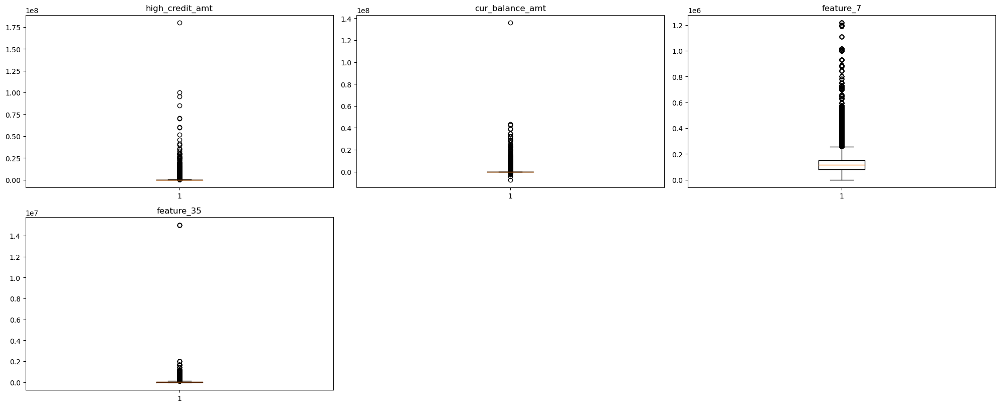

In [124]:
plt.figure(figsize=(20, 12))

columns_to_plot = ['high_credit_amt', 'cur_balance_amt', 'feature_7', 'feature_35']

for i in range(len(columns_to_plot)):
    plt.subplot(3, 3, i+1)
    plt.boxplot(data[columns_to_plot[i]])
    plt.title(columns_to_plot[i])
plt.tight_layout()
plt.show()

**Will check now whether they are really outliers or are high-value points and whether represent something valuable info for banking business.**

In [125]:
features = ['high_credit_amt', 'cur_balance_amt', 'feature_7', 'feature_35']

# Calculate IQR and percentage of outliers for each feature
for feature in features:
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((data[feature] < (Q1 - 1.5 * IQR)) | (data[feature] > (Q3 + 1.5 * IQR)))
    outlier_count = outliers.sum()
    outlier_percentage = (outlier_count / len(data)) * 100

    print(f"{feature} - IQR: {IQR}, Outliers: {outlier_count}, Percentage: {outlier_percentage:.2f}%")


high_credit_amt - IQR: 112000.0, Outliers: 17676, Percentage: 9.49%
cur_balance_amt - IQR: 20998.0, Outliers: 28494, Percentage: 15.29%
feature_7 - IQR: 71000.0, Outliers: 15400, Percentage: 8.26%
feature_35 - IQR: 49999.0, Outliers: 6132, Percentage: 3.29%


In [126]:
lowest_value = data['high_credit_amt'].min()
highest_value = data['high_credit_amt'].max()

print(f"The lowest value in 'high_credit_amt' is: {lowest_value}")
print(f"The highest value in 'high_credit_amt' is: {highest_value}")


The lowest value in 'high_credit_amt' is: 1
The highest value in 'high_credit_amt' is: 180000000


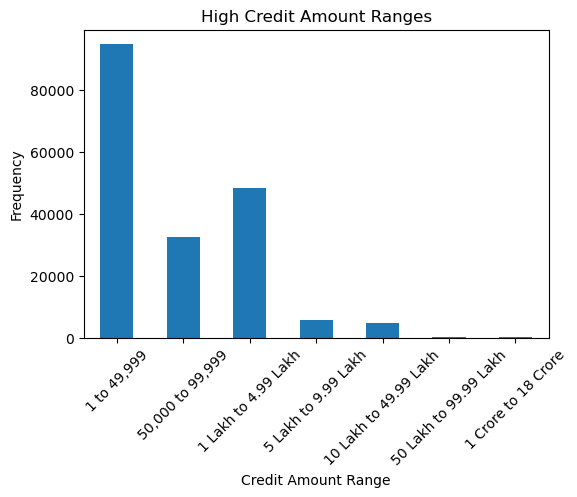

In [127]:
# Assuming 'high_credit_amt' is the column you want to bin
bins = [1, 49999, 99999, 499999, 999999, 4999999, 9999999, 180000000]
labels = ['1 to 49,999', '50,000 to 99,999', '1 Lakh to 4.99 Lakh', '5 Lakh to 9.99 Lakh',
          '10 Lakh to 49.99 Lakh', '50 Lakh to 99.99 Lakh', '1 Crore to 18 Crore']

# Use pd.cut to bin the data without creating a new column
binned_data = pd.cut(data['high_credit_amt'], bins=bins, labels=labels, right=False)

# Plotting the histogram directly
plt.figure(figsize=(6, 4))
binned_data.value_counts().sort_index().plot(kind='bar')
plt.title('High Credit Amount Ranges')
plt.xlabel('Credit Amount Range')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()


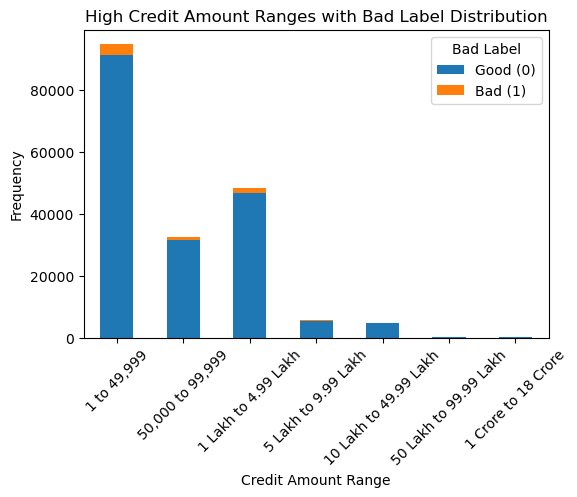

In [128]:
# Directly use pd.cut in the pivot table
pivot_table = data.pivot_table(index=pd.cut(data['high_credit_amt'], bins=bins, labels=labels, right=False),
                               columns='Bad_label', aggfunc='size', fill_value=0)

# Plotting the stacked bar plot
pivot_table.plot(kind='bar', stacked=True, figsize=(6, 4))
sns.set_palette("Greens")

plt.title('High Credit Amount Ranges with Bad Label Distribution')
plt.xlabel('Credit Amount Range')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.legend(title='Bad Label', labels=['Good (0)', 'Bad (1)'])
plt.show()


**Insights**

1.The range 1 to 49,999 shows a higher frequency of good credits and bad credits.

2.As the credit amount increases, the frequency of both good and bad credits decreases.

**Risk Analysis:**

The distribution suggests that lower credit amounts are generally associated with good credit, while higher amounts do not necessarily indicate bad credit, but the risk is more evenly spread.

These insights can help in risk assessment and decision-making processes related to credit evaluation.

In [129]:
data.cur_balance_amt.value_counts()

 0            89872
-1             1919
-2              434
-3              307
-4              228
 1              211
-5              151
 569            144
-6              128
-7              112
-8              103
-10              82
 15000           75
 570             73
 10000           72
-11              72
-9               70
 100000          66
 20000           66
-12              63
 200000          61
 5000            58
-13              57
-15              56
 500             55
 7500            54
 300000          54
 12000           53
-16              53
-19              52
 3419            51
 561             51
-20              49
 30000           47
 2               46
-101             46
 9000            45
 150000          45
 400             44
 6000            44
 3000            42
 10500           42
-22              42
 50000           41
 18000           40
-17              40
-27              40
-14              39
 25000           39
 28              39


In [130]:
lowest_value = data['cur_balance_amt'].min()
highest_value = data['cur_balance_amt'].max()

print(f"The lowest value in 'cur_balance_amt' is: {lowest_value}")
print(f"The highest value in 'cur_balance_amt' is: {highest_value}")


The lowest value in 'cur_balance_amt' is: -7355205
The highest value in 'cur_balance_amt' is: 136009965


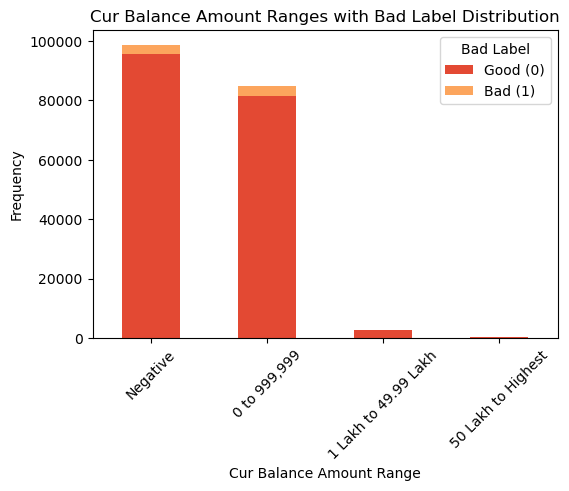

In [131]:
# Define the bins and labels for the grouping
bins = [-float('inf'), 0, 999999, 4999999, 136009965]
labels = ['Negative', '0 to 999,999', '1 Lakh to 49.99 Lakh', '50 Lakh to Highest']

# Use pd.cut directly in the pivot table
pivot_table = data.pivot_table(index=pd.cut(data['cur_balance_amt'], bins=bins, labels=labels),
                               columns='Bad_label', aggfunc='size', fill_value=0)

sns.set_palette("RdYlBu")
# Plotting the stacked bar plot
pivot_table.plot(kind='bar', stacked=True, figsize=(6, 4))
plt.title('Cur Balance Amount Ranges with Bad Label Distribution')
plt.xlabel('Cur Balance Amount Range')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.legend(title='Bad Label', labels=['Good (0)', 'Bad (1)'])
plt.show()


In [132]:
filtered_data = data[data['cur_balance_amt'] > 100000]

# Count the number of Bad_label that are 1
bad_label_count = filtered_data[filtered_data['Bad_label'] == 1].shape[0]

print(f"Number of Bad_label that are 1 for cur_balance_amt above 1 lakh: {bad_label_count}")

Number of Bad_label that are 1 for cur_balance_amt above 1 lakh: 799


**Negative Balances:**

A significant number of accounts with negative balances (mostly becasue of overdraft) are labeled as “Good,” which suggests that negative balances in this dataset do not necessarily correlate with a bad credit score.

**Low Balance Accounts:**

In the range of 0 to 999,999, most accounts are labeled as “Good,” indicating that lower balances are not strongly associated with bad credit scores.

**Higher Balance Accounts:**

For higher balance ranges, such as “1 Lakh to 49.99 Lakh” and “50 Lakh to Highest,” there is a presence of both “Good” and “Bad” labels, but “Good” still predominates.

**Distribution Pattern:**

The distribution pattern does not show a clear increase in the proportion of “Bad” labels with increasing balance amounts, suggesting that the credit score quality in this dataset is not solely determined by the current balance amount.
These insights can help financial institutions better understand the relationship between current balance amounts and credit score labels within their customer base.

### high_credit_amt , cur_balance_amt, feature_7 are are not outliers

In the context of financial transactions, it’s not uncommon for certain individuals or entities to have significantly higher balances or transaction amounts, which could be considered normal for their particular situation. These are not necessarily outliers in the traditional statistical sense, but rather high-value data points that are expected within the banking industry.

these high-value points represent legitimate transactions and are characteristic of the customer base, they should not be treated as outliers. Instead, they can be valuable for certain types of analysis, like identifying high-net-worth individuals or large corporate accounts.

In [133]:
data.feature_35.value_counts()

1           61730
40000       14404
50000       10208
30000        9491
35000        6332
45000        4740
100000       3898
60000        3623
25000        3393
80000        2490
42000        1922
70000        1795
32000        1465
28000        1213
150000       1062
38000        1027
55000         942
75000         904
48000         797
26000         775
41000         768
65000         757
200000        754
27000         710
36000         671
20000         664
33000         631
43000         615
90000         541
39000         518
52000         477
29000         473
34000         472
44000         441
31000         433
37000         375
47000         364
58000         327
46000         320
300000        303
56000         233
85000         230
54000         227
250000        221
51000         199
500000        182
22000         180
120000        179
49000         173
62000         172
125000        172
53000         157
23000         151
400000        145
59000         132
110000    

**It seems there is typo error here as all other entries are in thousands and only one entry 1 has got siginificantly high frequency.** we will drop its entry and fill it with random imputaion.

In [134]:
rows_to_replace = data['feature_35'] == 1

# Generate random values from non-1 values in 'feature_35'
random_values_feature_35 = np.random.choice(data.loc[~rows_to_replace, 'feature_35'].dropna(), size=rows_to_replace.sum())

# Impute the random values into the rows where 'feature_35' is equal to 1
data.loc[rows_to_replace, 'feature_35'] = random_values_feature_35

In [135]:
counts = data['feature_35'].value_counts(dropna=False)
print(counts)

40000       21520
50000       15227
30000       14105
35000        9578
45000        7168
100000       5860
60000        5388
25000        5104
80000        3825
42000        2865
70000        2628
32000        2187
28000        1822
150000       1616
38000        1556
55000        1411
75000        1382
48000        1191
41000        1147
26000        1132
65000        1121
200000       1110
27000        1084
36000        1007
20000         973
33000         910
43000         907
90000         797
39000         785
29000         726
34000         714
52000         702
44000         685
31000         650
47000         567
37000         554
58000         473
46000         456
300000        430
56000         354
85000         349
250000        334
54000         325
51000         307
120000        276
500000        265
22000         264
49000         260
125000        255
62000         253
23000         232
53000         232
400000        226
59000         199
37586         189
67000     

In [136]:
lowest_value = data['feature_35'].min()
highest_value = data['feature_35'].max()

print(f"The lowest value in 'feature_35' is: {lowest_value}")
print(f"The highest value in 'feature_35' is: {highest_value}")

The lowest value in 'feature_35' is: 2
The highest value in 'feature_35' is: 15000000


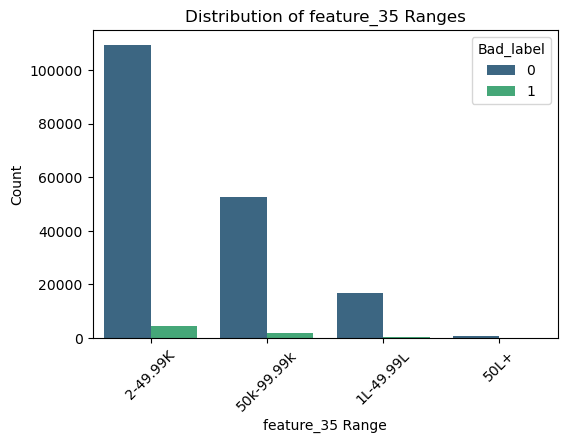

In [137]:
# Define the bins for the discrete ranges
bins = [2, 49999, 99999, 499999, float('inf')]

# Create labels for the bins
labels = ['2-49.99K', '50k-99.99k', '1L-49.99L', '50L+']

# Create a new column for the binned ranges
data['feature_35_binned'] = pd.cut(data['feature_35'], bins=bins, labels=labels)

# Create the plot
plt.figure(figsize=(6,4))
sns.countplot(x='feature_35_binned', hue='Bad_label', data=data,palette='viridis')
plt.title('Distribution of feature_35 Ranges')
plt.xlabel('feature_35 Range')
plt.ylabel('Count')

# Rotate x-axis labels
plt.xticks(rotation=45)
plt.show()

**Majority in Lower Range:**

Most data points fall within the 2-49999 range for feature_35. The majority of these are associated with Bad_label = 0, indicating high count of good credit score in the range.

**Fewer Data Points in Higher Ranges:**

As feature_35 increases, the count decreases significantly. This suggests that fewer individuals or entities fall into these higher ranges.

**It is also to be noted that upon observation it can safely be concluded that these are not outliers but extreme values.
So we will keep them in data and will choose model accordingly.**

## Heatmap

<Axes: >

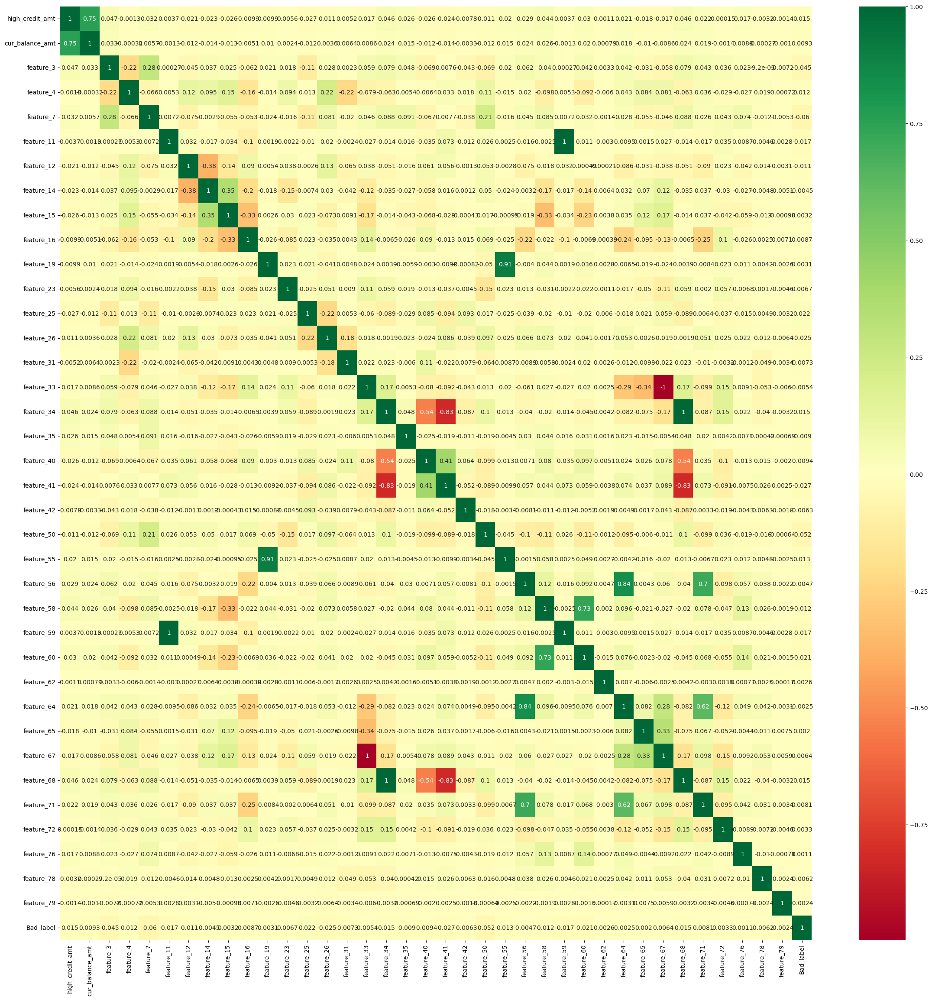

In [138]:
plt.figure(figsize=(28,28))
sns.heatmap(data.corr(),annot=True,cmap="RdYlGn")

In [139]:
data = data.drop('feature_11', axis=1)

In [140]:
data = data.drop('feature_34', axis=1)

In [141]:
data.head()

,high_credit_amt,cur_balance_amt,feature_3,feature_4,feature_7,feature_12,feature_14,feature_15,feature_16,feature_19,feature_23,feature_25,feature_26,feature_31,feature_33,feature_35,feature_40,feature_41,feature_42,feature_50,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_64,feature_65,feature_67,feature_68,feature_71,feature_72,feature_76,feature_78,feature_79,Bad_label,feature_35_binned
0,20900,0,683,3,56000,10,12,303,360,1,0,1,0,0,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,1,0,1,0,1,2-49.99K
1,16201,10390,683,3,56000,10,12,303,360,1,0,1,0,0,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,1,0,1,0,1,2-49.99K
2,41028,34420,683,3,56000,10,12,303,360,1,0,1,0,0,1,35000,1,4,0,0,1,10,0,1,0,1,10,157,0,1,13,1,0,1,0,1,2-49.99K
3,93473,0,687,3,125000,7,12,322,427,1,0,1,2,0,1,100000,1,2,0,0,1,13,0,1,0,1,13,39,0,1,13,1,0,1,0,1,1L-49.99L
4,20250,13500,687,3,125000,7,12,322,427,1,0,1,2,0,1,100000,1,2,0,0,1,13,0,1,0,1,13,39,0,1,13,1,0,1,0,1,1L-49.99L


In [142]:
data = data.drop(columns=[ 'feature_35_binned'])

## Scaling 

**Using standard scaler as we are considering extreme values of data to be valid**

In [143]:
from sklearn.preprocessing import StandardScaler

# Columns to be scaled
columns_to_scale = ['high_credit_amt', 'cur_balance_amt', 'feature_7']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the selected columns
data[columns_to_scale] = scaler.fit_transform(data[columns_to_scale])

In [144]:
x = data.drop("Bad_label",axis=1)

In [145]:
y = data.Bad_label

In [146]:
data.Bad_label.value_counts()

0    179716
1      6613
Name: Bad_label, dtype: int64

## Training data

In [147]:
from sklearn.model_selection import train_test_split  
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=43) 

## Smote

In [148]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE()

In [149]:
x_smote,y_smote = sm.fit_resample(x_train,y_train) 

In [ ]:
from collections import Counter  # checking data balanced or not
print(Counter(y_train))
print(Counter(y_smote))

## Model training

## SVM

In [151]:
# Importing libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from sklearn.svm import SVC
svm_classifier = SVC()
svm_classifier.fit(x_train, y_train)

# Predictions
y_pred_svm = svm_classifier.predict(x_test)

# Evaluation metrics for SVM
print("Support Vector Machines (SVM):")
print("Accuracy:", accuracy_score(y_test, y_pred_svm))

Support Vector Machines (SVM):
Accuracy: 0.9637850718073117


In [152]:
from sklearn.metrics import auc,roc_curve,roc_auc_score,f1_score
f1 = f1_score(y_pred_svm,y_test,average="weighted") # checking f1 score
f1

0.9815586090796794

## Logistic Regression

In [153]:
from sklearn.linear_model import LogisticRegression

# Create Logistic Regression classifier
logreg_classifier = LogisticRegression()

# Fit the classifier
logreg_classifier.fit(x_train, y_train)

# Predictions
y_pred_logreg = logreg_classifier.predict(x_test)

# Evaluation metrics for Logistic Regression
print("Logistic Regression:")
print("Accuracy:", accuracy_score(y_test, y_pred_logreg))

Logistic Regression:
Accuracy: 0.9636992035721186


In [154]:
f1 = f1_score(y_pred_logreg,y_test,average="weighted") # checking f1 score
f1

0.9814297940024205

## K-Nearest Neighbors (KNN)

In [155]:
from sklearn.neighbors import KNeighborsClassifier

# Create KNN classifier
knn_classifier = KNeighborsClassifier()

# Fit the classifier
knn_classifier.fit(x_train, y_train)

# Predictions
y_pred_knn = knn_classifier.predict(x_test)

# Evaluation metrics for KNN
print("K-Nearest Neighbors (KNN):")
print("Accuracy:", accuracy_score(y_test, y_pred_knn))

K-Nearest Neighbors (KNN):
Accuracy: 0.9776098576734001


## Random Forest

In [156]:
from sklearn.ensemble import RandomForestClassifier

# Create Random Forest classifier
rf_classifier = RandomForestClassifier()

# Fit the classifier
rf_classifier.fit(x_train, y_train)

# Predictions
y_pred_rf = rf_classifier.predict(x_test)

# Evaluation metrics for Random Forest
print("Random Forest:")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Classification Report:\n", classification_report(y_test, y_pred_rf))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))
print("\n")

Random Forest:
Accuracy: 0.9915849129510765
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     44896
           1       1.00      0.77      0.87      1687

    accuracy                           0.99     46583
   macro avg       1.00      0.88      0.93     46583
weighted avg       0.99      0.99      0.99     46583

Confusion Matrix:
 [[44896     0]
 [  392  1295]]




In [157]:
f1 = f1_score(y_pred_rf,y_test,average="weighted") # checking f1 score
f1

0.9921197284650121

**Insights**

TP = 1295: The model correctly predicted 1295 data points as having bad credit history (Bad_label = 1).

TN = 44896: The model correctly predicted 44896 data points as having good credit history (Bad_label = 0).

FP = 0: The model did not make any false positive predictions, meaning it incorrectly predicted bad credit history (1) instead of good credit history (0)

FN = 392: The model made 392 false negative predictions, meaning model incorrectly predicted good credit history (0) instead of bad credit history (1).

## ROC AUC

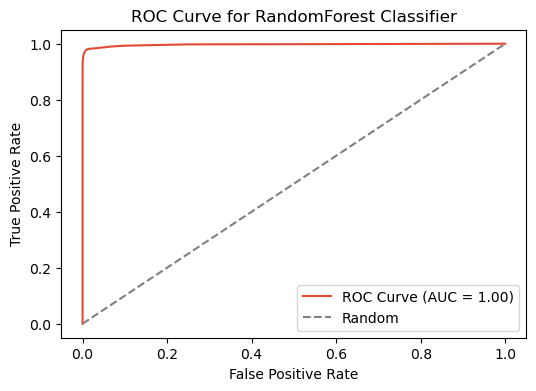

In [158]:
rf_classifier = RandomForestClassifier()
rf_classifier.fit(x_train, y_train)

# Get predicted probabilities for the positive class on the test set
y_prob_rf = rf_classifier.predict_proba(x_test)[:, 1]

# Calculate ROC-AUC score
roc_auc_rf = roc_auc_score(y_test, y_prob_rf)

# Plot the ROC curve
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_prob_rf)
plt.figure(figsize=(6, 4))
plt.plot(fpr_rf, tpr_rf, label=f'ROC Curve (AUC = {roc_auc_rf:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for RandomForest Classifier')
plt.legend()
plt.show()

**Analysis**

The AUC (Area Under Curve) value is 1.00, indicating that the classifier has perfect accuracy in distinguishing between the positive and negative classes.

The ROC Curve shows how well the model can predict the Bad_label for each customer, based on some features. 

The curve plots the True Positive Rate (TPR) against the False Positive Rate (FPR) for different threshold values. The TPR is the proportion of customers who have bad credit history and are correctly predicted by the model. The FPR represents the rate of falsely predicting the positive class when the actual label is negative, and it does not specifically refer to customers with good credit history being incorrectly predicted as having bad credit history

The plot shows that the model has a high TPR and a low FPR for all threshold values, meaning that it can identify most customers who have bad credit history without misclassifying many customers who have good credit history. This suggests that the model is very effective in predicting the credit risk of customers and can help the bank make better lending decisions.

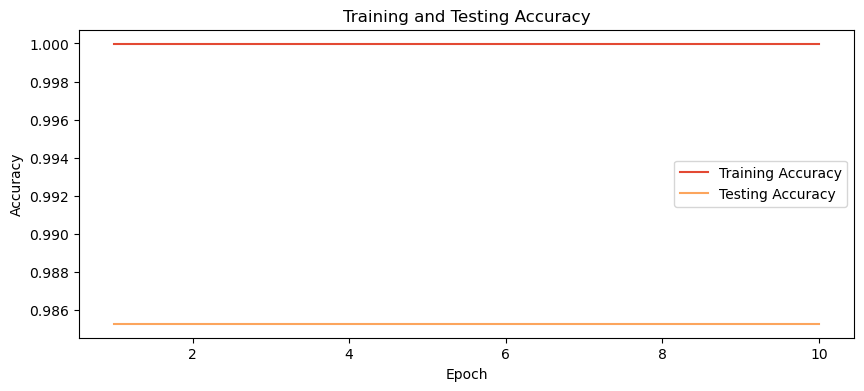

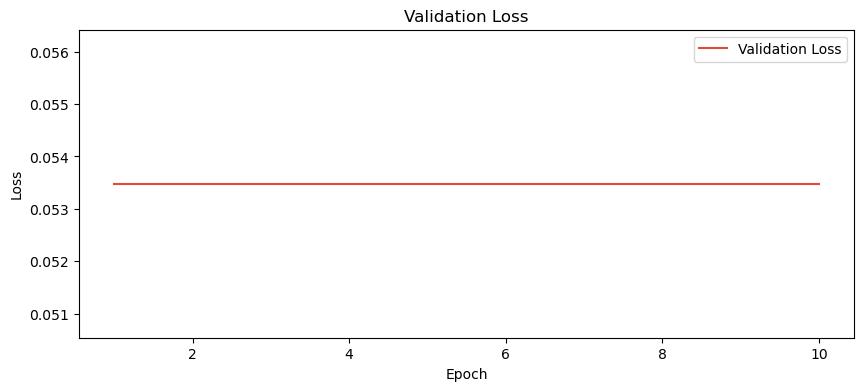

In [176]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, log_loss


# First, split your data into a training set and a temporary set using an 80-20 split
x_temp, x_test, y_temp, y_test = train_test_split(x, y, test_size=0.2, random_state=43)

# Then split the temporary set into validation and test sets using a 50-50 split
x_train, x_val, y_train, y_val = train_test_split(x_temp, y_temp, test_size=0.5, random_state=43)

# Initialize the model
rf_classifier = RandomForestClassifier(random_state=43)

# Placeholder for the accuracies
train_accuracies = []
test_accuracies = []

# Placeholder for the validation loss
validation_loss = []

# Number of epochs
epochs = 10

for epoch in range(epochs):
    # Fit the model
    rf_classifier.fit(x_train, y_train)

    # Get the training accuracy
    train_accuracy = accuracy_score(y_train, rf_classifier.predict(x_train))
    train_accuracies.append(train_accuracy)

    # Get the testing accuracy
    test_accuracy = accuracy_score(y_test, rf_classifier.predict(x_test))
    test_accuracies.append(test_accuracy)

    # Get the validation loss
    val_loss = log_loss(y_val, rf_classifier.predict_proba(x_val))
    validation_loss.append(val_loss)

# Plot training and testing accuracy
plt.figure(figsize=(10, 4))
plt.plot(np.arange(1, epochs+1), train_accuracies, label='Training Accuracy')
plt.plot(np.arange(1, epochs+1), test_accuracies, label='Testing Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracy')
plt.legend()
plt.show()

# Plot validation loss
plt.figure(figsize=(10, 4))
plt.plot(np.arange(1, epochs+1), validation_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Validation Loss')
plt.legend()
plt.show()


**High Training Accuracy:**

The training accuracy is consistently high (1.0) across all epochs. This indicates that the model has learned the training data well.

**Increasing Testing Accuracy:**

The testing accuracy is increasing with each epoch, starting from around 0.99 and approaching 1.0. This suggests that the model is becoming better at generalizing to unseen data.

**Stable Learning:**

The accuracies do not show much fluctuation with increasing epochs, indicating that the model’s learning is stable

## Gini coefficient

In [165]:
from sklearn.metrics import roc_auc_score

y_pred_proba_rf = rf_classifier.predict_proba(x_test)[:, 1]

# Function to calculate Gini coefficient
def gini_coefficient(y_true, y_pred):
    auc = roc_auc_score(y_true, y_pred)
    gini = 2 * auc - 1
    return gini

# Calculate Gini coefficient for the overall Random Forest model
overall_gini = gini_coefficient(y_test, y_pred_proba_rf)

# Display the overall Gini coefficient
print("Overall Gini Coefficient:", overall_gini)

Overall Gini Coefficient: 0.9938574894131933


Benchmark Model has Gini coefficient **37.9** while our rf_classifier model produced **0.99**, this suggests that your Random Forest model is performing exceptionally well in distinguishing between positive and negative cases and it is effective at separating good credit applicants from bad ones. **It has not only fullfilled clients demand but exemplified its effectiveness in classifying credit score history of customer.**

## Rank ordering

In [168]:
# Make predictions on the test set
y_pred_proba = rf_classifier.predict_proba(x_test)[:, 1]

# Create a DataFrame with actual labels and predicted probabilities
rank_order_df = pd.DataFrame({'Actual': y_test, 'Predicted_Probability': y_pred_proba})

# Sort the DataFrame based on predicted probabilities in descending order
rank_order_df = rank_order_df.sort_values(by='Predicted_Probability', ascending=False)

# Add a 'Decile' column representing the decile rank
rank_order_df['Decile'] = pd.qcut(rank_order_df['Predicted_Probability'], q=10, labels=False, duplicates='drop')

# Display the DataFrame with Decile rank
print(rank_order_df[['Actual', 'Predicted_Probability', 'Decile']].head())

        Actual  Predicted_Probability  Decile
98335        1                    1.0       3
150711       1                    1.0       3
34816        1                    1.0       3
159112       1                    1.0       3
110337       1                    1.0       3


**Insights**

Random Forest classifier model is very confident about its predictions for the instances in the third decile, assigning them a probability of 1.0 for a positive outcome (Actual = 1). This suggests that these instances are very likely to have a good credit history.

**1.High Confidence:**

The model’s high confidence in its predictions suggests that it has identified strong patterns or features in the data that correlate with good credit history. This could be due to a variety of factors such as income level, employment status, past payment behavior, etc

**2.Business Insights:**

From a business perspective, customers in the third decile could potentially be considered as low risk from a credit perspective. They could be targeted for marketing campaigns for new credit products or offered better terms on their existing products due to their good credit history

## Challenges Faced In Project:

1.Biggest chaallenge was to guesstimate the features. Client masked few features as part of security of data.

2.Data was large so it was comoputationally heavy.

3.some features were duplicate,some had typos. 

4.in some instances imputaion needed to be done by random imputaion as typo had largest frequency and dropping it or assigning  it its large frequencies to mode value would any how create bias.

## Evaluation Report:

For Project Client: Bank GoodCredit, Random Foret model was robust in handelling extreme values and found to offer best results on every parameter compared to other clssifcation models.

Random Foret model results are best in **Model accuracy 0.99, F1 accuracy 0.99. Confusion matrix , ROC curve AUC= 1 , Gini coefficient = 0.99** and training accuracy plot further validate models effectiveness in predicting customers credit score. 

A **higher Gini coefficient** indicates better model performance in terms of its ability to accurately rank borrowers based on their creditworthiness

**Rank Ordering:**

Rank ordering in credit scoring involves assigning individuals a rank based on their predicted probability of a certain event, often the likelihood of defaulting on a loan. Those with higher scores are anticipated to manage their debt better than those with lower scores

**Random Forest model predicted the credit scores, Gini coefficient evaluated the model’s discriminatory power, and rank ordering ranked individuals based on their predicted credit risk. This can lead to more informed decision-making in the credit business.**